In [4]:
import numpy as np 
import pandas as pd
import os
import glob
import fnmatch
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objects as go

from plotly.subplots import make_subplots
import plotly.graph_objects as go


In [5]:
from lib.data_classes.folder import pffpDataFolder
from lib.signal_processing.signal_function import moving_average, find_deriv_change

In [6]:
# Testing the binary file classa
#TODO: for some reason I need the full path to read the files, I'll need to look into this in the future
folder_dir = r"/home/sandbiter/Documents/BlueDrop_Analysis_Lib/Mouth_1"

calibration_dir = r"BlueDrop_Calibration_Factors.xlsx"

In [7]:
# TODO: Combine the pffp_id and the read_calibration_excel_sheet just have the objet call inside

test_folder = pffpDataFolder(folder_dir, pffp_id = 3, calibration_factor_dir=calibration_dir)

In [138]:
# Read the calibration data
test_folder.read_calibration_excel_sheet("bluedrop_3")
test_folder.calibration_excel_sheet
# Select the specific calibration params
test_folder.get_sensor_calibration_params("Sequim_2021")

# Display Calibration params
test_folder.calibration_params

# Init a pffpFile instances for each binary file and store the results in the folder
test_folder.store_pffp_files()

pffp_file_id = 14
print(test_folder.pffp_files[pffp_file_id])
print(len(test_folder.pffp_files))
# Get the sensor data
df = test_folder.pffp_files[pffp_file_id].binary_2_sensor_df(acceleration_unit = "g")
display(df)

File Directory: /home/sandbiter/Documents/BlueDrop_Analysis_Lib/Mouth_1/bLog0D39.bin 
Num Drops in file: Not Checked         
Drop Date: 2024-03-28 
Drop Time: 21:14:41.551404 
19


,Time,2g_accel,18g_accel,50g_accel,pore_pressure,200g_accel,55g_x_tilt,55g_y_tilt,250g_accel
0,0.000000,1.191874,1.190395,1.123976,47.813924,1.491271,0.041505,0.055665,1.162952
1,0.000008,1.194495,1.185619,1.154612,47.619452,1.491657,0.023072,0.048285,1.202493
2,0.000017,1.192429,1.184243,1.148280,47.238167,1.494383,0.047684,0.050625,1.268516
3,0.000025,1.192355,1.192566,1.128956,47.101637,1.486360,0.046979,0.054075,1.255751
4,0.000033,1.195481,1.198876,1.157283,47.453618,1.497263,0.001684,0.056984,1.218045
...,...,...,...,...,...,...,...,...,...
119995,0.999967,1.080012,1.071487,1.001826,84.820187,1.374065,0.111127,0.030213,0.959308
119996,0.999975,1.082381,1.079932,1.016138,84.721286,1.376534,0.073031,0.057854,0.884115
119997,0.999983,1.079603,1.070839,1.016578,84.412262,1.376225,0.039990,0.105204,0.933265
119998,0.999992,1.085044,1.075413,1.018903,84.495512,1.375891,0.050189,0.075432,0.993640


### Steps to check if the file has a drop in it

- ~~Check if there's a peak in the data greater than the criteria~~
- ~~Use slight smoothing???~~

- find the start of the drop
    * Use derivative method
    * Use Eric method

- find the end of the drop
    * Use the peak of the drop and scan to the left for the first time drop goes to some value?

- Might be able to use the pore pressure sensor also (Check the pore pressure if it's reading atmospheric, otherwise if there's a value check if the value makes sense with the acclerometer check)
- Use the convolution to check if there's a drop in the data

### Questions that I need to answer
1) how long is a drop? I want to be able to trim the df files around a drop
2) 

In [139]:
# select the accelerometer of interest
selected_accelerometer = "18g_accel"

# Convert the df to a np array
accel = np.array(df[selected_accelerometer])
df_time = np.array(df["Time"])
# Calc the moving average
averaged_accel = moving_average(accel, window_size=50)

# Resample time
time = np.linspace(0, 1, len(averaged_accel))

print(len(time))

119951


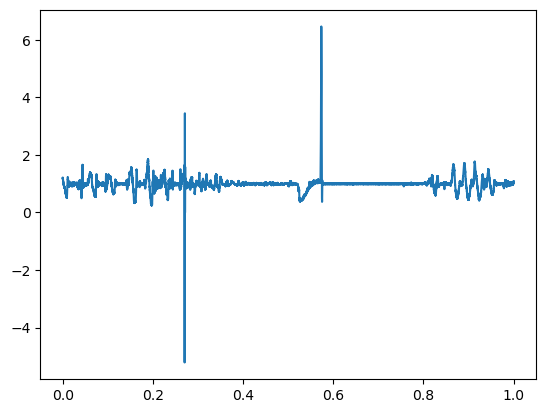

In [140]:

# fig = make_subplots(rows = 1, cols = 1)

# # PLot the smoothed acceleration
# fig.add_trace(
#     go.Scatter(x = time, y = averaged_accel, mode = "lines", name = "smoothed"),
#     row = 1, col = 1
# )

plt.plot(df_time, accel)

In [11]:
# Smooth the drop

# Get an intial guess if there's a drop in the file

# Do some other checks to see if it's a drop
# Find the start and end of the drop

from scipy.signal import find_peaks
      

def find_drops(accel_data, impact_time_tol = 0.015, sample_freq = 120_000, min_peak_height = 2.8):
    # Purpose: Get a first estimate of the number of drops in a file

    # time_tolerance: Expected time difference between drops - asumme 0.5 seconds for the time being
    # sample_freq: sample frequency of the data assumed to have the same units as time_tolerance

    # Calc assumed tolerance for the length of impact
    impact_window = impact_time_tol * sample_freq

    drop_indexs, drop_info = find_peaks(accel_data, height = min_peak_height, distance = impact_window)
    
    num_drops = len(drop_indexs)

    return drop_indexs, drop_info, num_drops

# drop_index, drop_info, num_drops = find_drops(averaged_accel)
drop_index, drop_info, num_drops = find_drops(accel)
print("drops index: ", drop_index)

# if num_drops > 0:
#     print("Drop Info: ", drops)
#     print("Peak time of drops: ", time[drops])



drops index:  [91742]


1200
119951


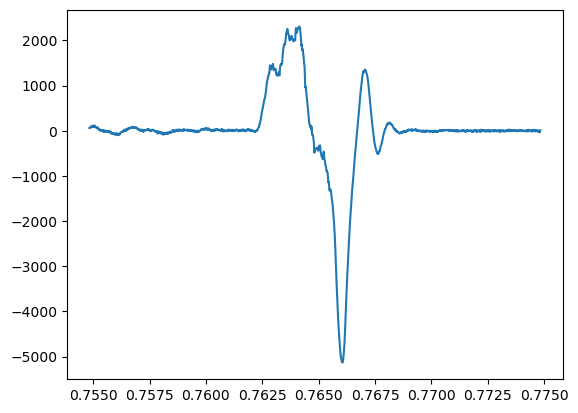

In [12]:
# For each drop index select the part of the 
frequency = 120_000
time_window = 0.01
index_window = int(time_window * frequency)
print(index_window)
# index_arr = np.array([drop_index[0] - index_window: drop_index[0] + index_window])
# print(index_arr)
print(len(time))

# Calc the gradient of the plot

deriv_changes_index = find_deriv_change(df_time[drop_index[0] - index_window: drop_index[0] + index_window], averaged_accel[drop_index[0] - index_window: drop_index[0] + index_window], 300)[0] + drop_index[0]

# Calc the derivative of the index window
acceleration_derivative = np.gradient(averaged_accel[drop_index[0] - index_window: drop_index[0] + index_window], df_time[drop_index[0] - index_window: drop_index[0] + index_window])
plt.plot(time[drop_index[0] - index_window: drop_index[0] + index_window], acceleration_derivative)

In [13]:
# function to find the first time a signal reaches a point after a certain index

def find_signal_value(signal, value, start_index, end_index = None, num_occurrences = 1, tolerance = 1e-5):
    # Purpose: Find where a signal equals a value after a certain starting index within a tolerance

    # select the part of the signal of interest
    selected_signal = signal[start_index:end_index]

    # Subtract off the value
    arr = selected_signal - value

    # Find the location where the difference is less than the tolerance
    indices = np.where((-tolerance < arr) & (arr < tolerance))[0]
    print(start_index + indices)
    # Select the number of occurences wanted
    return start_index + indices[:num_occurrences]

arr = np.linspace(0,1, 3)
    
# Find where the signal goes back to a certain value
# start_drop_index = find_signal_value(averaged_accel, value = 1.2, start_index = drop_index[0] - index_window, end_index = drop_index[0], num_occurrences=1, tolerance = 1e-1)
# end_drop_index = find_signal_value(averaged_accel, value = 0.99, start_index = drop_index[0], num_occurrences=1, tolerance = 1e-1)

start_drop_index = find_signal_value(accel, value = 1.2, start_index = drop_index[0] - index_window, end_index = drop_index[0], num_occurrences=1, tolerance = 1e-1)
end_drop_index = find_signal_value(accel, value = 0.99, start_index = drop_index[0], num_occurrences=1, tolerance = 1e-1)

print(f"start index: {start_drop_index}")
print(f"end index: {end_drop_index}")

[91498 91499 91500 91501 91502 91503 91504 91505 91506 91507 91508 91509
 91510 91511 91512 91513 91514 91515 91516 91517 91518 91519 91520 91521]
[ 91937  91938  91939 ... 119997 119998 119999]
start index: [91498]
end index: [91937]


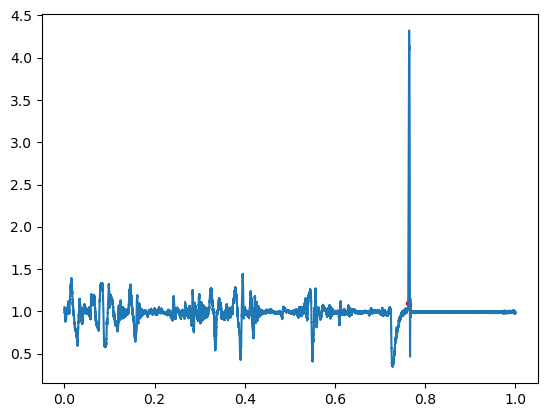

In [14]:
start = drop_index[0] - index_window
end = drop_index[0]

plt.plot(df_time, accel)
plt.scatter(df_time[start_drop_index], accel[start_drop_index], marker = ".", color = "red")
plt.scatter(df_time[end_drop_index], accel[end_drop_index], marker = ".", color = "red", s = 10)
# plt.plot(time[start:end], averaged_accel[start:end])

In [15]:


fig = make_subplots(rows = 2, cols = 1)

# PLot the smoothed acceleration
fig.add_trace(
    go.Scatter(x = df_time, y = accel, mode = "lines", name = "intial"),
    row = 1, col = 1
)

# PLot the smoothed acceleration
fig.add_trace(
    go.Scatter(x = time, y = averaged_accel, mode = "lines", name = "smoothed"),
    row = 1, col = 1
)

# Plot the location where the derivative meets the criteria
fig.add_trace(
    go.Scatter(x = df_time[deriv_changes_index], y = accel[deriv_changes_index], mode = "markers", name = "deriv_changes"),
    row = 1, col = 1
)

# Plot the location of the peak 
fig.add_trace(
    go.Scatter(x = df_time[drop_index], y = accel[drop_index], mode = "markers", name = "drop peak"),
    row = 1, col = 1
)

# Plot the beginning of the drop
fig.add_trace(
    go.Scatter(x = df_time[start_drop_index], y = accel[start_drop_index], mode = "markers", name = "begin drop"),
    row = 1, col = 1
)

# Plot the predicted end of drop
fig.add_trace(
    go.Scatter(x = df_time[end_drop_index], y = accel[end_drop_index], mode = "markers", name = "drop end"),
    row = 1, col = 1
)

# Plot the derivative of the acceleration
fig.add_trace(
    go.Scatter(x = time[drop_index[0] - index_window: drop_index[0] + index_window], y = acceleration_derivative, mode = "lines", name = "derivative"),
    row = 2, col = 1
)

fig.show()

### Steps to get the drops from a file
1) Trim the data to be around the drops
2) 

### Functions that should be created

#### Plotting

#### Spike identificaiton
    * Acceleration threshold
    * derivative check
    * Find peaks using
#### Filtering
